# Data Measurements 


Calculating optimal aperture for: phot_00.fits
  Optimal Aperture: 12 px

Calculating optimal aperture for: phot_01.fits
  Optimal Aperture: 10 px

Calculating optimal aperture for: phot_02.fits
  Optimal Aperture: 10 px

Calculating optimal aperture for: phot_03.fits
  Optimal Aperture: 10 px

Calculating optimal aperture for: phot_04.fits
  Optimal Aperture: 11 px

Calculating optimal aperture for: phot_05.fits
  Optimal Aperture: 12 px

Calculating optimal aperture for: phot_06.fits
  Optimal Aperture: 12 px

Calculating optimal aperture for: phot_07.fits
  Optimal Aperture: 12 px

Calculating optimal aperture for: phot_08.fits
  Optimal Aperture: 12 px

Calculating optimal aperture for: phot_09.fits
  Optimal Aperture: 11 px

Calculating optimal aperture for: phot_10.fits
  Optimal Aperture: 10 px

Calculating optimal aperture for: phot_11.fits
  Optimal Aperture: 12 px

Calculating optimal aperture for: phot_12.fits
  Optimal Aperture: 12 px

Calculating optimal aperture for: pho

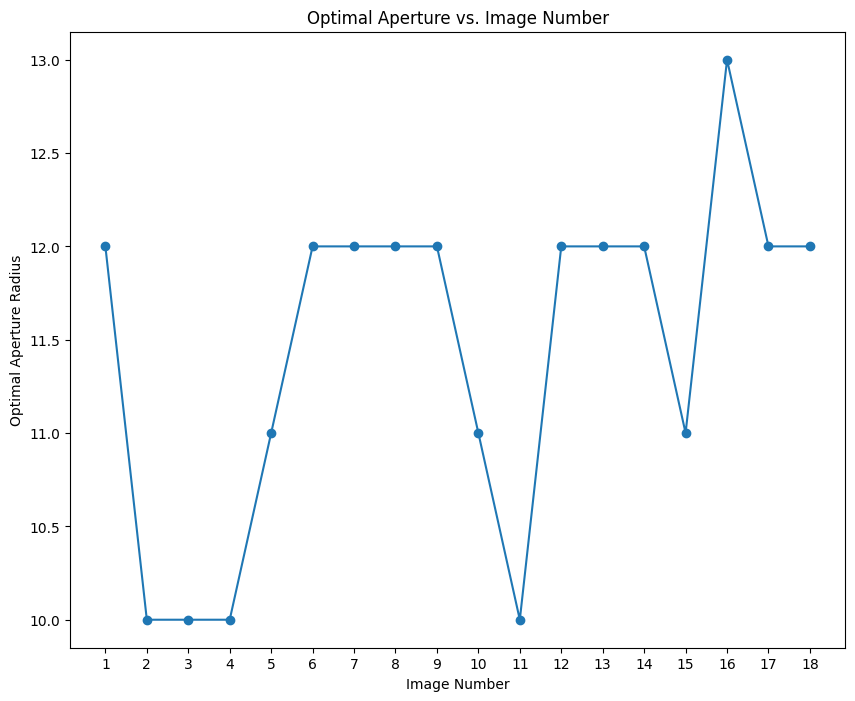

In [17]:
import astropy
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.coordinates import SkyCoord
from astropy import units as u
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from photutils.aperture import CircularAperture, CircularAnnulus, aperture_photometry
from astroquery.simbad import Simbad
from astropy.wcs import WCS
import warnings
from astropy.wcs import FITSFixedWarning

warnings.filterwarnings('ignore', category=FITSFixedWarning, message=".*'datfix' made the change.*")

# --- 0. Setup ---
wd = r"C:\Users\friesco\workstation\fr-p\studies\ASTRO716\data_excercise"
os.chdir(wd)
plt.rcParams['figure.figsize'] = [10, 8]

# --- 1. Load Calibration Star Data ---
calibration_stars_df = pd.read_csv('calibration_stars.csv')

# --- 2. Load Image Files ---
phot_files = [f for f in os.listdir(wd) if f.startswith('phot_') and f.endswith('.fits')]
phot_files.sort()

# --- 3. Define Nova's Coordinates ---
ra_nova = 11.176088536435575  # RA of the nova
dec_nova = 40.140699048618714  # DEC of the nova

# --- 4. Photometry Functions ---
def phot_counts(img, x, y, ap_rad, in_ann, out_ann):
    ap = CircularAperture((x, y), r=ap_rad)
    ann_ap = CircularAnnulus((x, y), r_in=in_ann, r_out=out_ann)
    phot_tbl = aperture_photometry(img, [ap, ann_ap])

    ann_mask = ann_ap.to_mask(method='center')
    ann_data = ann_mask.multiply(img)
    bkg_vals = ann_data[ann_mask.data > 0]
    mean, med, std = sigma_clipped_stats(bkg_vals, sigma=3.0)
    bkg_med = med
    bkg_sum = bkg_med * ap.area

    tot_counts = phot_tbl['aperture_sum_0'][0]
    return tot_counts, bkg_sum, ap.area

def calc_snr(tot_counts, bkg_counts, ap_area):
    mean_counts = (tot_counts - bkg_counts) / ap_area
    if tot_counts + bkg_counts <= 0:
        print("Warning: Negative counts. Returning SNR = 0")
        return 0.0
    err_counts = np.sqrt(tot_counts + bkg_counts) / ap_area
    return mean_counts / err_counts

def phot_mag(img, x, y, ap_rad, in_ann, out_ann):
    ap = CircularAperture((x, y), r=ap_rad)
    ann_ap = CircularAnnulus((x, y), r_in=in_ann, r_out=out_ann)
    phot_tbl = aperture_photometry(img, [ap, ann_ap])

    ann_mask = ann_ap.to_mask(method='center')
    ann_data = ann_mask.multiply(img)
    bkg_vals = ann_data[ann_mask.data > 0]
    mean, med, std = sigma_clipped_stats(bkg_vals, sigma=3.0)
    bkg_med = med
    bkg_sum = bkg_med * ap.area

    final_sum = phot_tbl['aperture_sum_0'][0] - bkg_sum
    if final_sum > 0:
        inst_mag = -2.5 * np.log10(final_sum) + 50
        mag_err = 1.0857 * (np.sqrt(phot_tbl['aperture_sum_0'][0] + bkg_sum) / final_sum)
        if np.isnan(inst_mag):
            print(f"Warning: inst_mag is NaN for x={x}, y={y}, ap_rad={ap_rad}")
    else:
        inst_mag = np.nan
        mag_err = np.nan
    return inst_mag, mag_err, bkg_med

# --- 5. Optimal Aperture Calculation ---
ap_radii_snr = np.arange(5, 40, 1)
in_ann, out_ann = 25, 35
opt_ap = []

for i, f in enumerate(phot_files):
    path = os.path.join(wd, f)
    with fits.open(path) as hdu:
        img = hdu[0].data
        hdr = hdu[0].header
        wcs = WCS(hdr)
        if img.dtype.byteorder == '>':
            img = img.byteswap().view(img.dtype.newbyteorder('<'))

        # Convert RA and DEC of the nova to pixel coordinates
        nx, ny = wcs.all_world2pix(ra_nova, dec_nova, 1)

        print(f"\nCalculating optimal aperture for: {f}")
        snrs = []
        for ap_rad in ap_radii_snr:
            tot_counts, bkg_counts, ap_area = phot_counts(img, nx, ny, ap_rad, in_ann, out_ann)
            if tot_counts + bkg_counts <= 0:
                print(f"Warning: Negative counts in {f}, aperture: {ap_rad}")
                snrs.append(0.0)
            else:
                snr = calc_snr(tot_counts, bkg_counts, ap_area)
                snrs.append(snr)

        opt_ap_rad = ap_radii_snr[np.argmax(snrs)]
        opt_ap.append(opt_ap_rad)
        print(f"  Optimal Aperture: {opt_ap_rad} px")

# --- 6. Perform Photometry on Nova and Calibration Stars ---
photometry_results = []

for i, f in enumerate(phot_files):
    path = os.path.join(wd, f)
    with fits.open(path) as hdu:
        img = hdu[0].data
        hdr = hdu[0].header
        wcs = WCS(hdr)
        if img.dtype.byteorder == '>':
            img = img.byteswap().view(img.dtype.newbyteorder('<'))

        print(f"\nPerforming photometry on: {f}")
        opt_ap_rad = opt_ap[i]

        # Nova
        nx, ny = wcs.all_world2pix(ra_nova, dec_nova, 1)
        inst_mag_nova, mag_err_nova, bkg_med_nova = phot_mag(img, nx, ny, opt_ap_rad, in_ann, out_ann)

        photometry_results.append({
            'image': f,
            'mjd': hdr['MJD'],
            'obj_type': 'nova',
            'id': 'nova',
            'ra': ra_nova,
            'dec': dec_nova,
            'x': nx,
            'y': ny,
            'opt_ap': opt_ap_rad,
            'inst_mag': inst_mag_nova,
            'mag_err': mag_err_nova,
            'bkg_med': bkg_med_nova,
            'r_prime': np.nan,  # Placeholder, to be filled in later
            'r_prime_err': np.nan,  # Placeholder, to be filled in later
        })

        # Calibration Stars
        for index, row in calibration_stars_df.iterrows():
            try:
                x, y = wcs.all_world2pix(row['RAJ2000'], row['DEJ2000'], 1)
                inst_mag, mag_err, bkg_med = phot_mag(img, x, y, opt_ap_rad, in_ann, out_ann)

                photometry_results.append({
                    'image': f,
                    'mjd': hdr['MJD'],
                    'obj_type': 'calibration_star',
                    'id': row['ID'],
                    'ra': row['RAJ2000'],
                    'dec': row['DEJ2000'],
                    'x': x,
                    'y': y,
                    'opt_ap': opt_ap_rad,
                    'inst_mag': inst_mag,
                    'mag_err': mag_err,
                    'bkg_med': bkg_med,
                    'r_prime': np.nan,  # Placeholder, to be filled in later
                    'r_prime_err': np.nan,  # Placeholder, to be filled in later
                })

            except Exception as e:
                print(f"Error processing star {row['ID']} in image {f}: {e}")

# --- 7. Convert Results to DataFrame ---
photometry_results_df = pd.DataFrame(photometry_results)

# --- 8. Display and Save Results ---
print("\nPhotometry Results:")
print(photometry_results_df)
photometry_results_df.to_csv('photometry_results.csv', index=False)

# --- 9. Plot Optimal Aperture vs. Image Number ---
print("\nOptimal Aperture Radii:", opt_ap)
plt.figure()
plt.plot(range(1, len(phot_files) + 1), opt_ap, 'o-')
plt.xlabel("Image Number")
plt.ylabel("Optimal Aperture Radius")
plt.title("Optimal Aperture vs. Image Number")
plt.xticks(range(1, len(phot_files) + 1))
plt.show()

In [11]:
import pandas as pd
import os

wd = r"C:\Users\friesco\workstation\fr-p\studies\ASTRO716\data_excercise"
os.chdir(wd)

cat = pd.read_csv('psdr1_new.tsv', sep='\t')

idx = [6, 8, 11, 19, 16, 14, 39]

cal_stars = [cat.iloc[i] for i in idx if i in cat.index]

df = pd.DataFrame(cal_stars)

print("Calibration Stars Data:")
print(df)

df.to_csv('calibration_stars.csv', index=False)


Calibration Stars Data:
    ID      _r      _RAJ2000      _DEJ2000        RAJ2000        DEJ2000  \
6    6  1.6237  00:44:32.777  +40:08:14.65  011.136572010  +40.137401840   
8    8  1.8871  00:44:40.081  +40:10:28.33  011.167005190  +40.174536750   
11  11  1.9916  00:44:49.714  +40:09:42.49  011.207143040  +40.161802730   
19  19  2.5476  00:44:53.694  +40:07:46.53  011.223726880  +40.129592630   
16  16  2.2198  00:44:49.074  +40:06:59.14  011.204473660  +40.116428300   
14  14  2.1331  00:44:29.967  +40:08:48.42  011.124861060  +40.146782980   
39  39  4.0544  00:44:57.464  +40:11:10.20  011.239432550  +40.186166800   

                 objID    f_objID Qual  Ns  ...  gFlags     rmag  e_rmag  \
6   156160111365675490  503635968   60  10  ...  115000  16.7696  0.0065   
8   156210111669980110  503635968   60   5  ...  115000  14.3144  0.0008   
11  156190112071334793  503635968   60   5  ...  115000  15.7283  0.0020   
19  156150112237426105  503635968   60   5  ...  115000  14.393

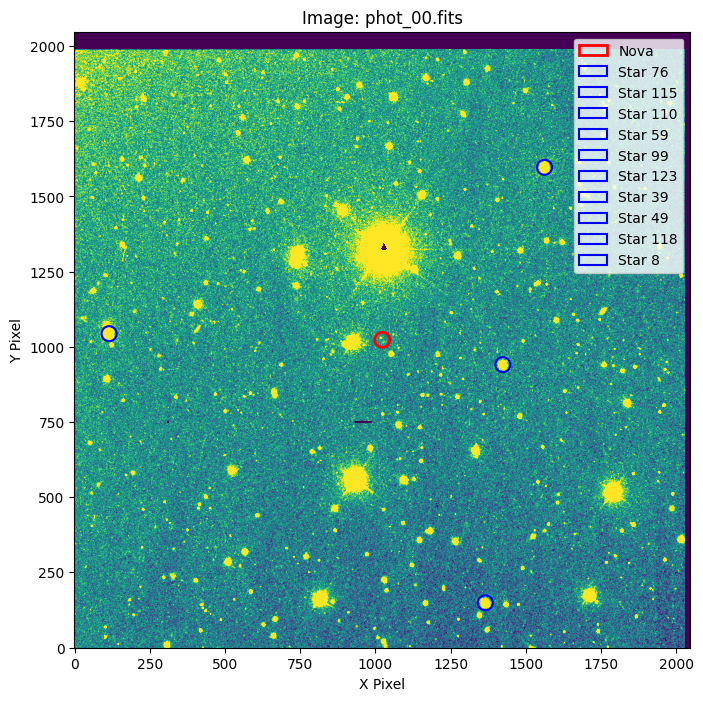

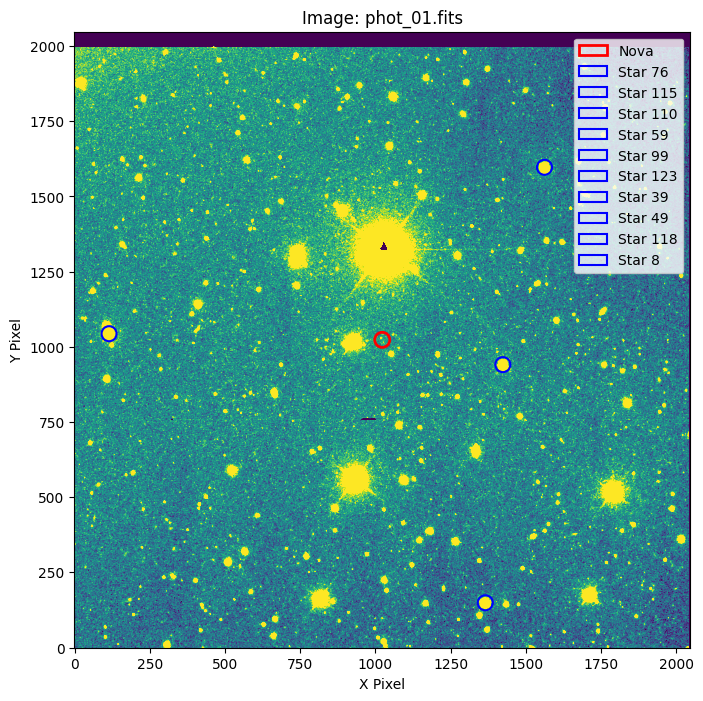

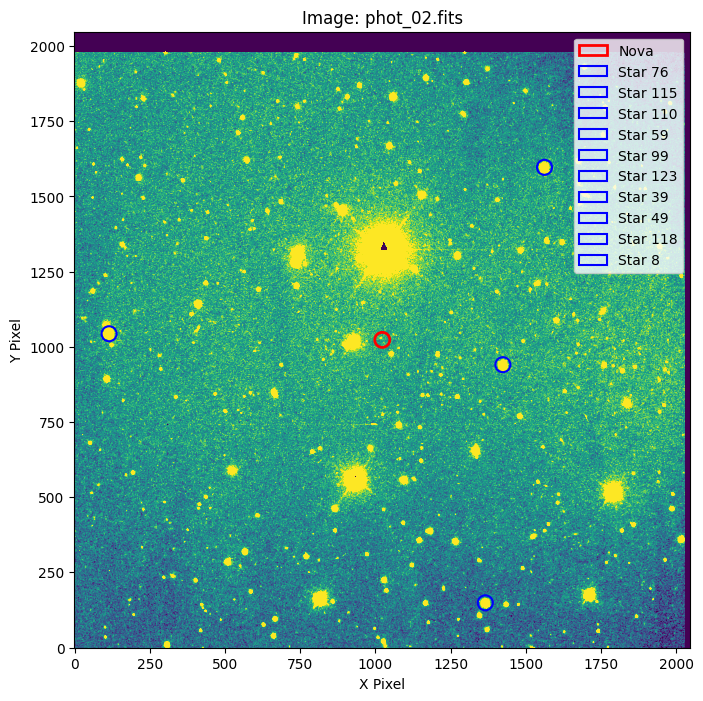

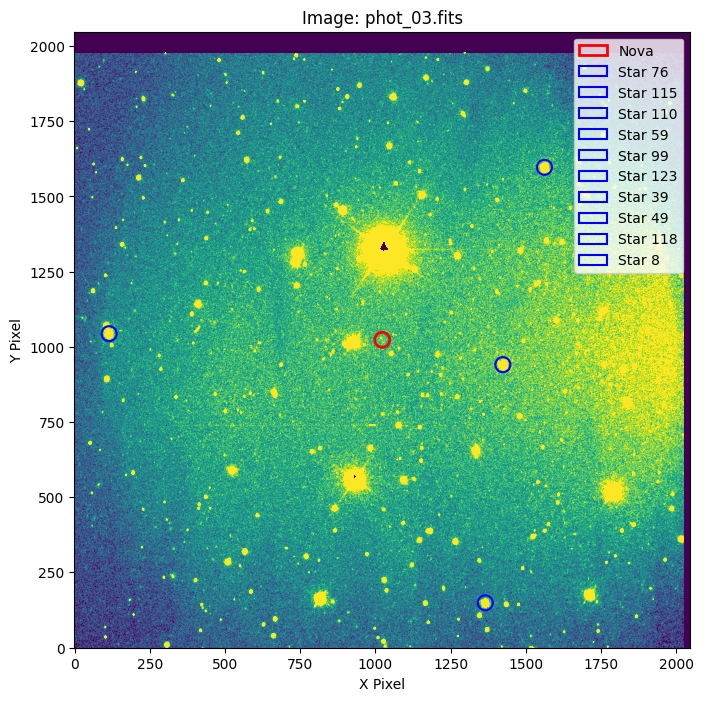

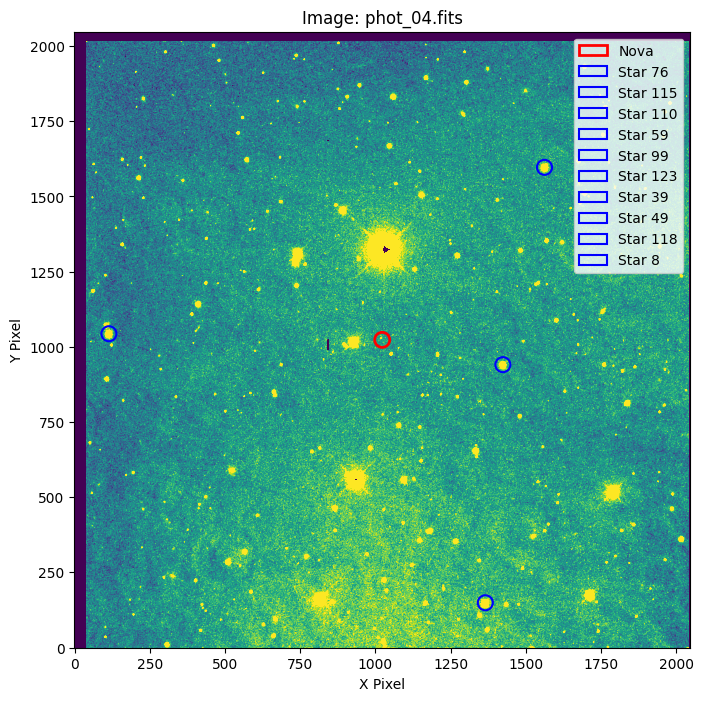

...

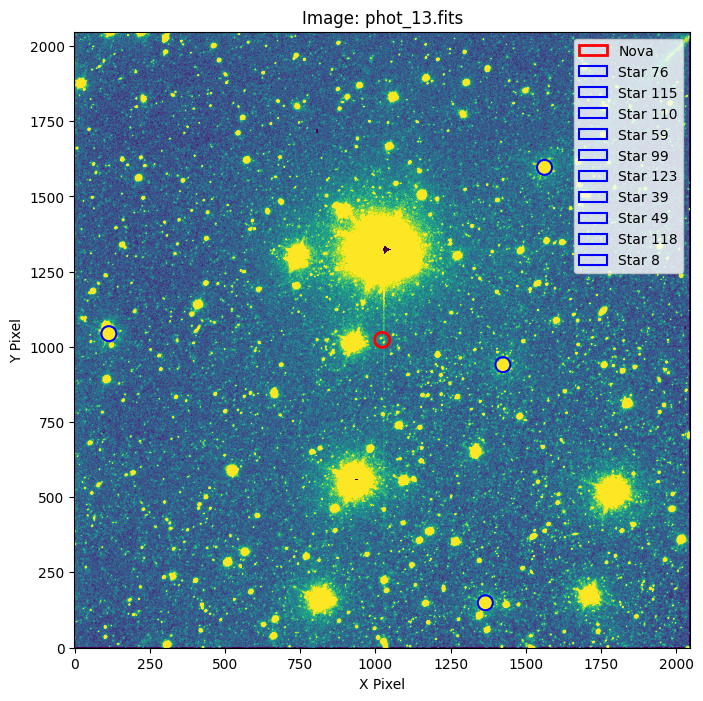

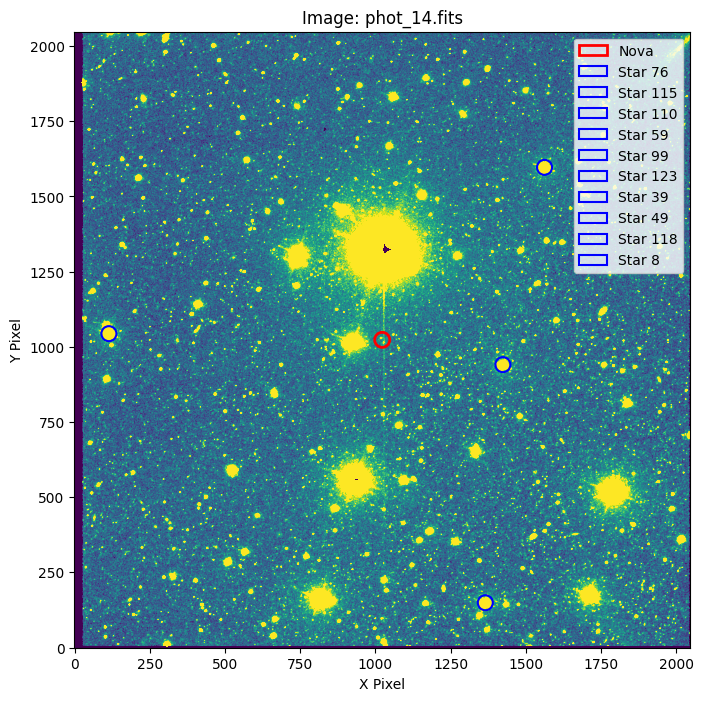

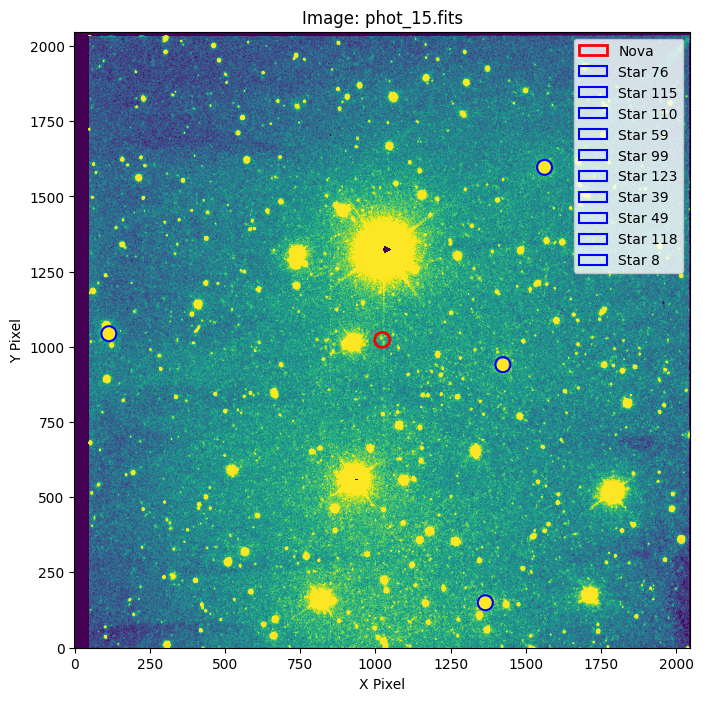

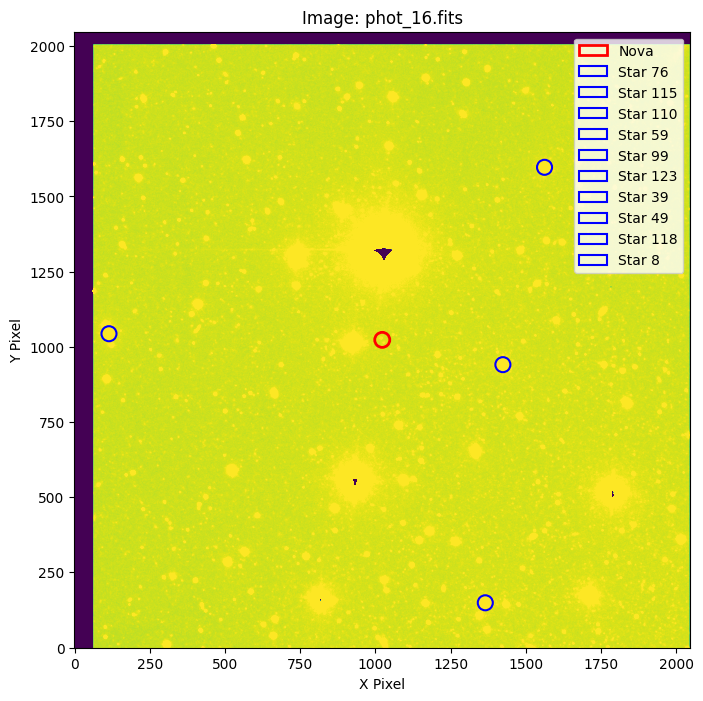

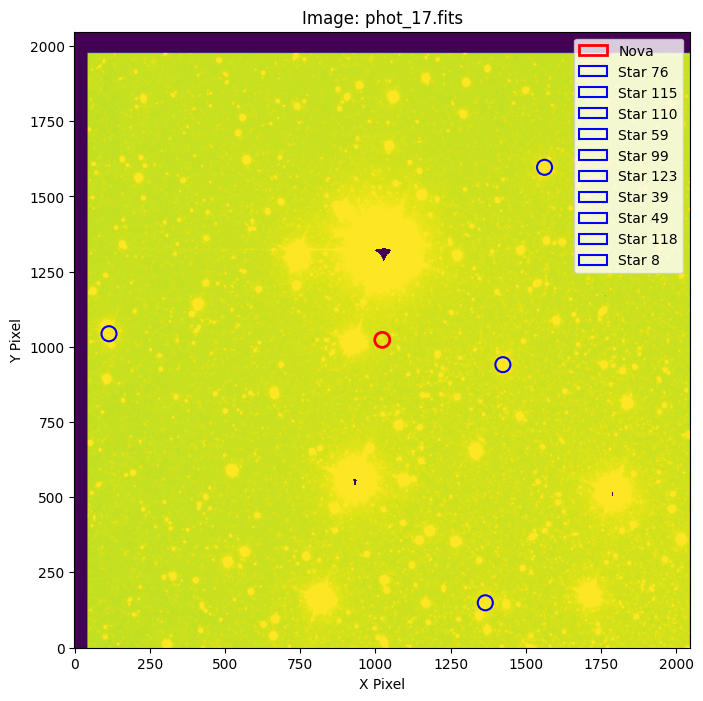

In [1]:
import astropy
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.coordinates import SkyCoord
from astropy import units as u
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from photutils.aperture import CircularAperture, CircularAnnulus, aperture_photometry
from astroquery.simbad import Simbad
from astropy.wcs import WCS
import warnings
from astropy.wcs import FITSFixedWarning

warnings.filterwarnings('ignore', category=FITSFixedWarning, message=".*'datfix' made the change.*")

# Setup
wd = r"C:\Users\friesco\workstation\fr-p\studies\ASTRO716\data_excercise\2"
os.chdir(wd)
plt.rcParams['figure.figsize'] = [10, 8]

# Load Data
calib_df = pd.read_csv('new_calibration_stars.csv')
files = sorted([f for f in os.listdir(wd) if f.startswith('phot_') and f.endswith('.fits')])

# Nova's coordinates
ra_nova = 11.176088536435575
dec_nova = 40.140699048618714

# Pixel Coordinate Conversion
def pix_coords(w, ra, dec):
    x, y = w.world_to_pixel(astropy.coordinates.SkyCoord(ra, dec, unit="deg"))
    return x, y

# Process Images
for i, fn in enumerate(files):
    path = os.path.join(wd, fn)
    with fits.open(path) as h:
        img = h[0].data
        hdr = h[0].header
        w = WCS(hdr)
        if img.dtype.byteorder == '>':
            img = img.byteswap().view(img.dtype.newbyteorder('<'))

        # Convert nova's RA, DEC to pixel coordinates
        nx, ny = w.world_to_pixel(astropy.coordinates.SkyCoord(ra_nova, dec_nova, unit="deg"))

        # Plot
        fig, ax = plt.subplots()
        plt.imshow(img, origin='lower', cmap='viridis', vmin=np.percentile(img, 5), vmax=np.percentile(img, 95))

        
        nova_ap = CircularAperture((nx, ny), r=25)
        nova_ap.plot(color='red', lw=2, label='Nova')

        for _, row in calib_df.iterrows():
            x, y = pix_coords(w, row['RAJ2000'], row['DEJ2000'])
            star_ap = CircularAperture((x, y), r=25)
            star_ap.plot(color='blue', lw=1.5, label=f'Star {row["ID"]}')

        plt.title(f'Image: {fn}')
        plt.xlabel('X Pixel')
        plt.ylabel('Y Pixel')

        hdl, lbl = plt.gca().get_legend_handles_labels()
        unique = {lbl[i]: hdl[i] for i in range(len(lbl))}
        plt.legend(unique.values(), unique.keys(), loc='upper right')

        plt.show()